In [1]:
!pip uninstall tensorflow -y
!pip install tensorflow-gpu==1.14.0
import tensorflow
device_name = tensorflow.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Uninstalling tensorflow-2.3.0:
  Successfully uninstalled tensorflow-2.3.0
     |████████████████████████████████| 377.0MB 47kB/s 
     |████████████████████████████████| 3.2MB 38.4MB/s 
     |████████████████████████████████| 491kB 39.5MB/s 
     |████████████████████████████████| 51kB 6.1MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

Found GPU at: /device:GPU:0


In [2]:
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    COLAB = True
    print("Note: using Google CoLab")
    %tensorflow_version 2.x
except:
    print("Note: not using Google CoLab")
    COLAB = False

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
Note: using Google CoLab


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model  0


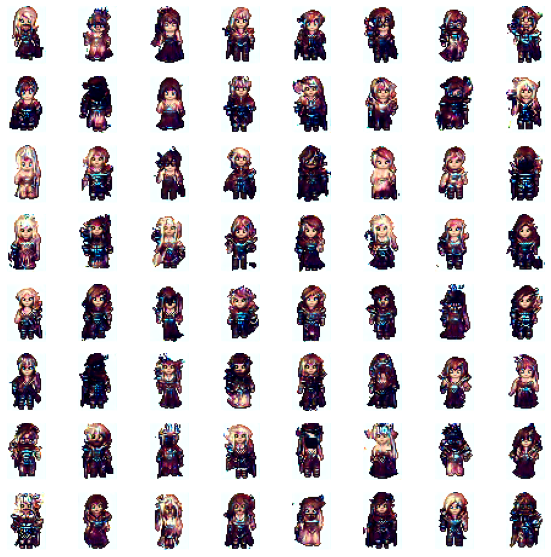

Model  1


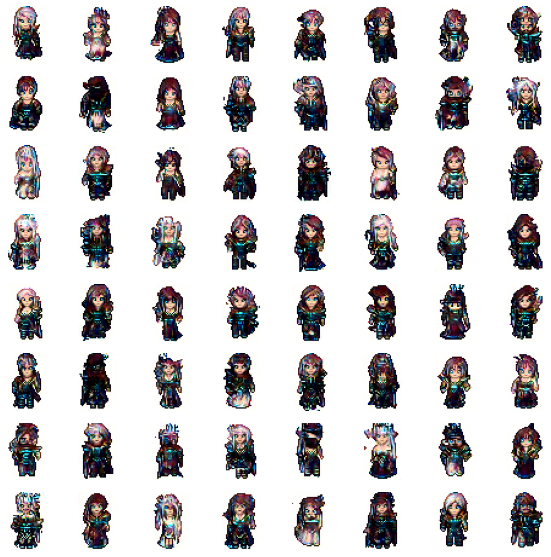

Model  2


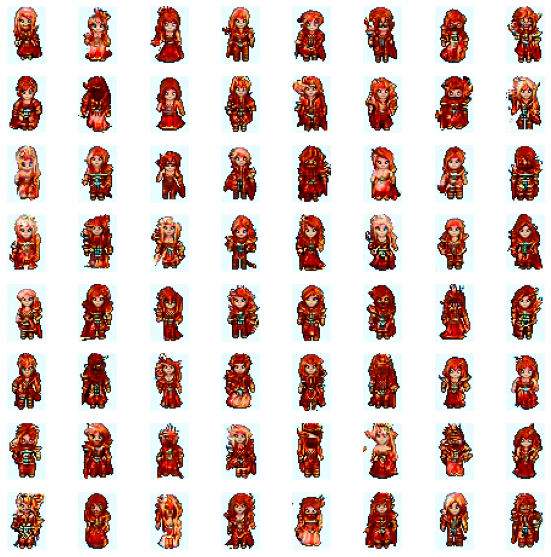

Model  3


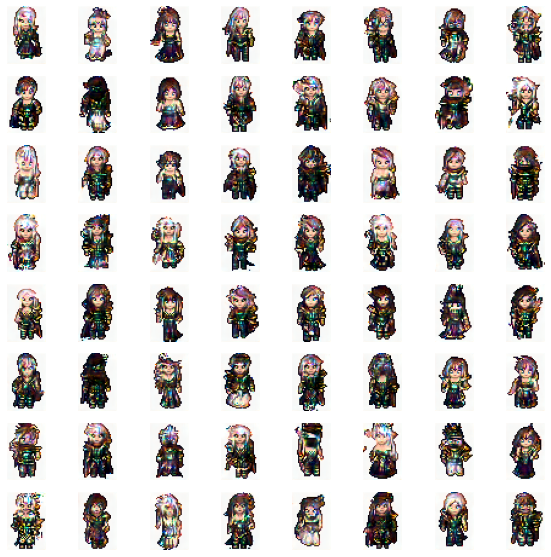

Model  4


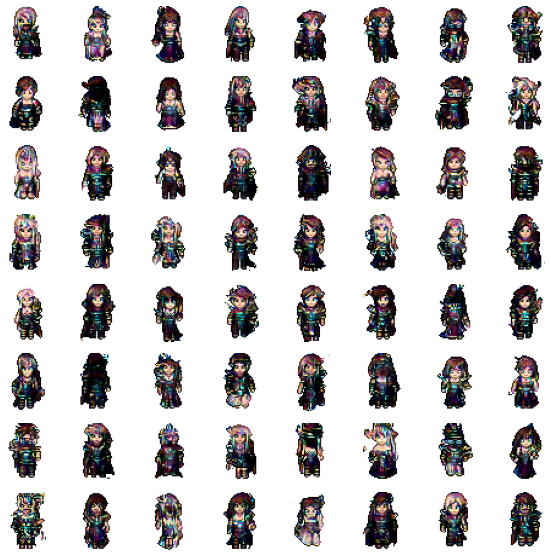

Model  5


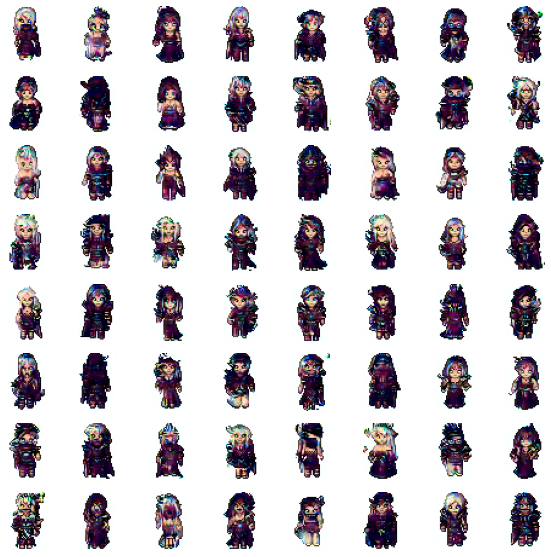

Model  6


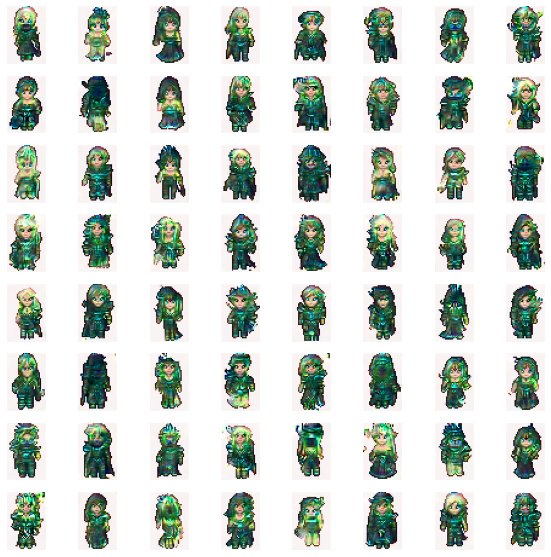

Model  7


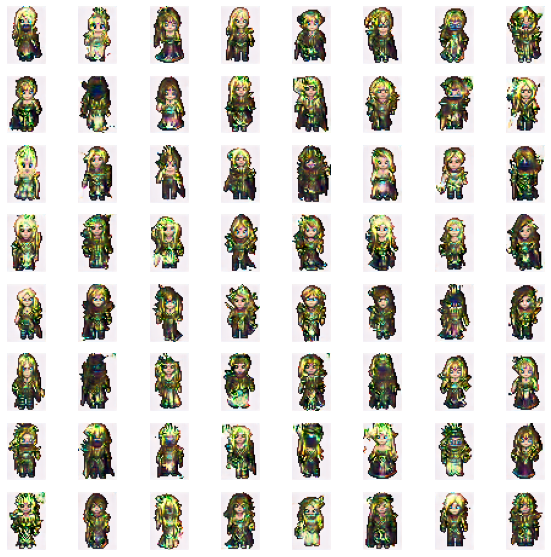

Model  8


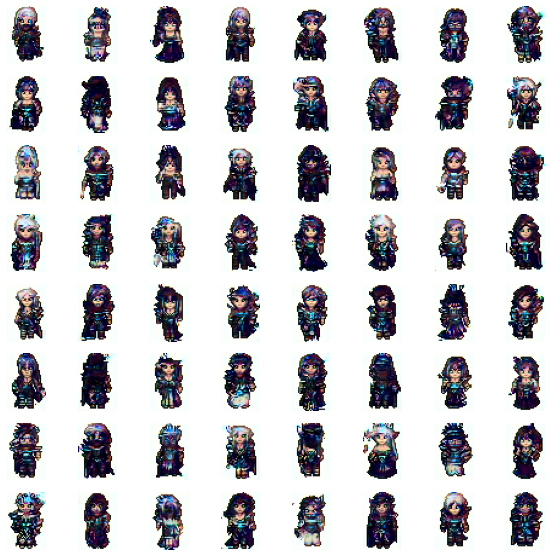

Model  9


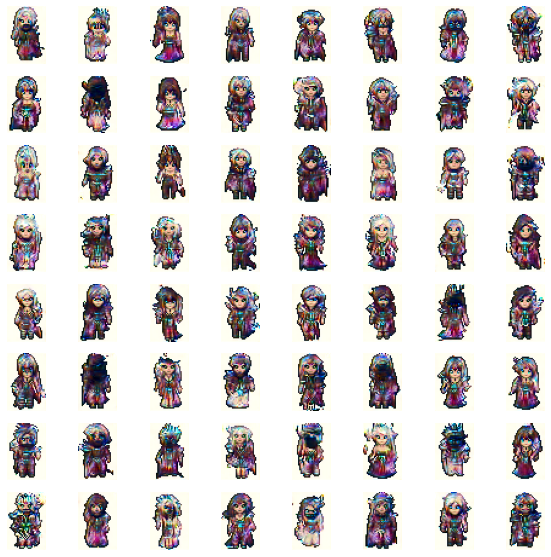

Model  10


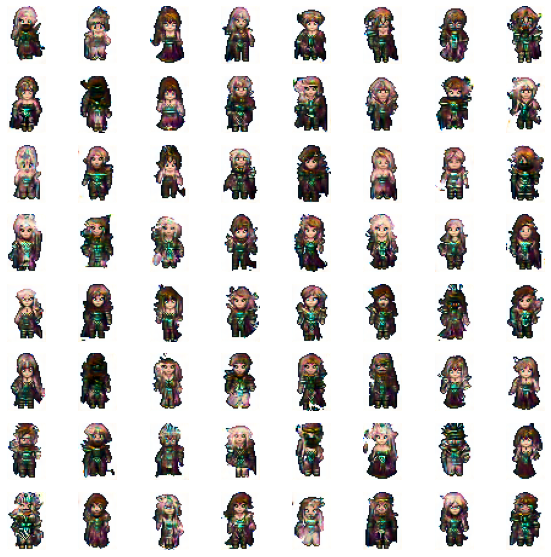

Model  11


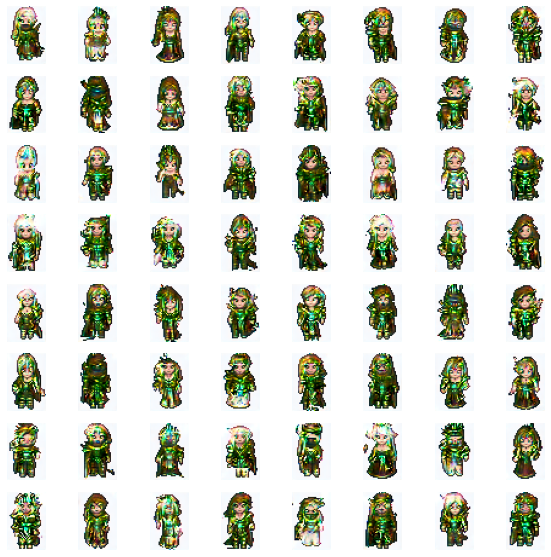

Model  12


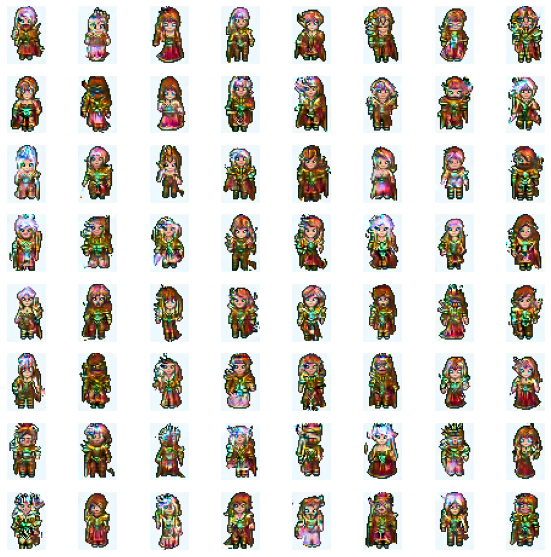

Model  13


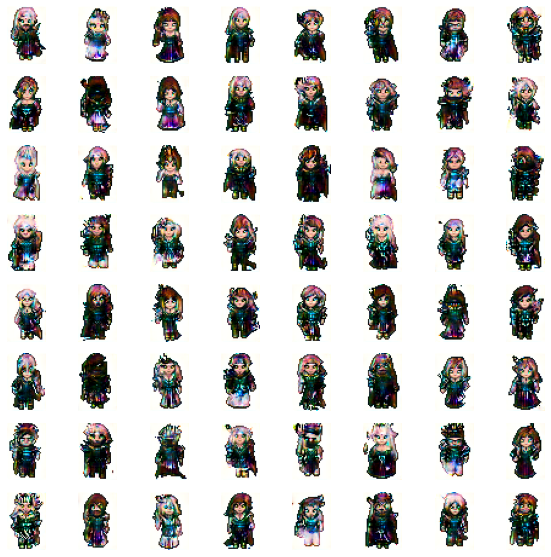

Model  14


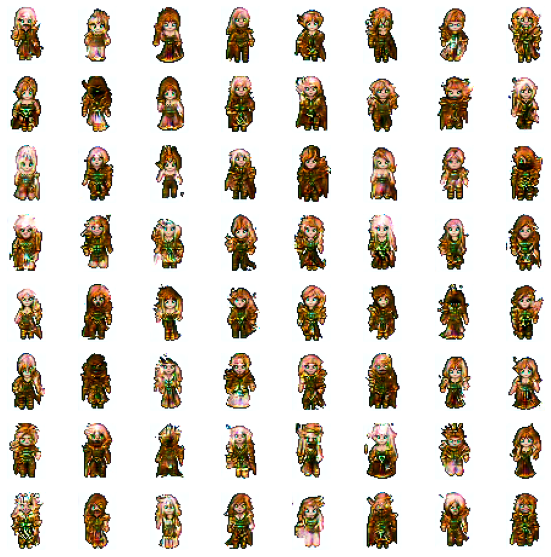

Model  15


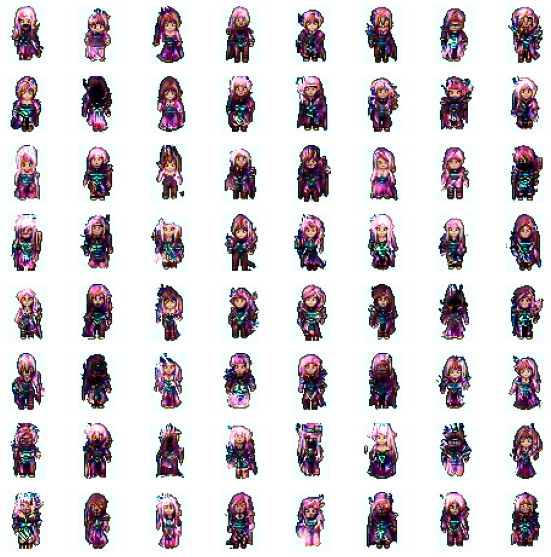

Model  16


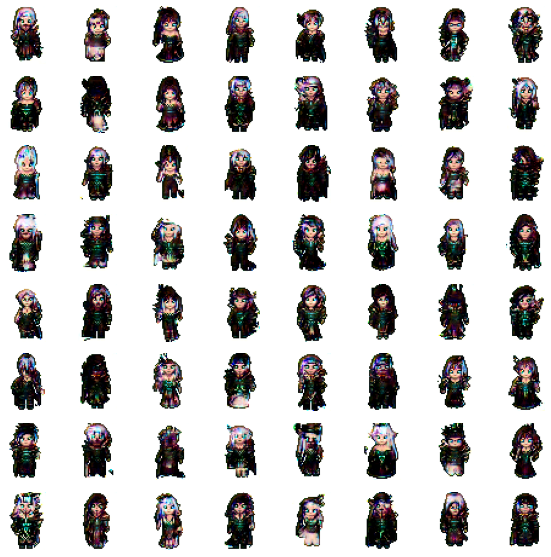

Model  17


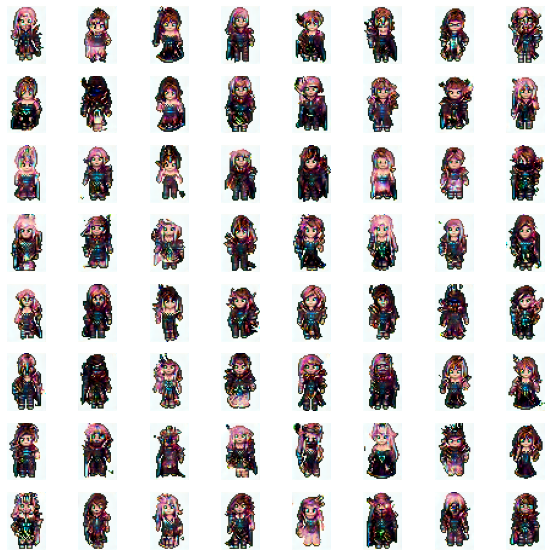

Model  18


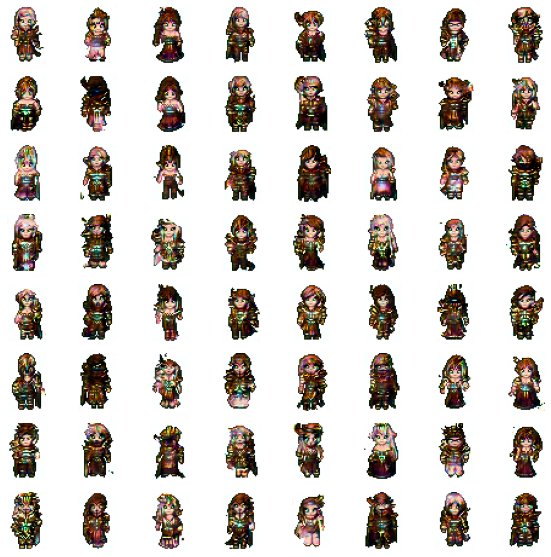

Model  19


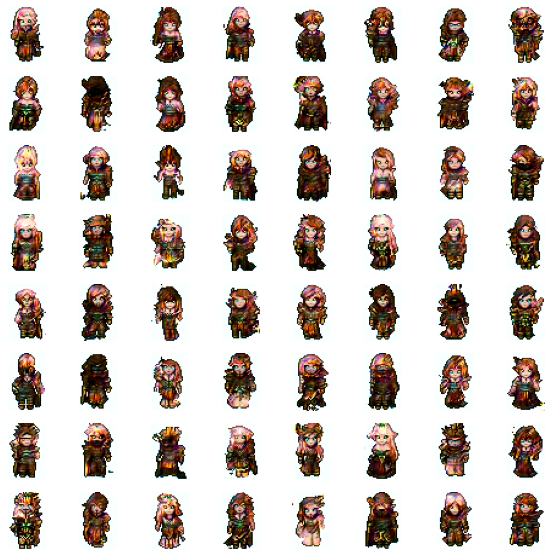

In [3]:
# example of loading the generator model and generating images
from math import sqrt
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Add
from tensorflow.keras import backend
from tensorflow.keras.models import load_model
from matplotlib import pyplot
import numpy as np

# pixel-wise feature vector normalization layer
class PixelNormalization(Layer):
    # initialize the layer
    def __init__(self, **kwargs):
        super(PixelNormalization, self).__init__(**kwargs)

    # perform the operation
    def call(self, inputs):
        # calculate square pixel values
        values = inputs**2.0
        # calculate the mean pixel values
        mean_values = backend.mean(values, axis=-1, keepdims=True)
        # ensure the mean is not zero
        mean_values += 1.0e-8
        # calculate the sqrt of the mean squared value (L2 norm)
        l2 = backend.sqrt(mean_values)
        # normalize values by the l2 norm
        normalized = inputs / l2
        return normalized

    # define the output shape of the layer
    def compute_output_shape(self, input_shape):
        return input_shape

# mini-batch standard deviation layer
class MinibatchStdev(Layer):
    # initialize the layer
    def __init__(self, **kwargs):
        super(MinibatchStdev, self).__init__(**kwargs)

    # perform the operation
    def call(self, inputs):
        # calculate the mean value for each pixel across channels
        mean = backend.mean(inputs, axis=0, keepdims=True)
        # calculate the squared differences between pixel values and mean
        squ_diffs = backend.square(inputs - mean)
        # calculate the average of the squared differences (variance)
        mean_sq_diff = backend.mean(squ_diffs, axis=0, keepdims=True)
        # add a small value to avoid a blow-up when we calculate stdev
        mean_sq_diff += 1e-8
        # square root of the variance (stdev)
        stdev = backend.sqrt(mean_sq_diff)
        # calculate the mean standard deviation across each pixel coord
        mean_pix = backend.mean(stdev, keepdims=True)
        # scale this up to be the size of one input feature map for each sample
        shape = backend.shape(inputs)
        output = backend.tile(mean_pix, (shape[0], shape[1], shape[2], 1))
        # concatenate with the output
        combined = backend.concatenate([inputs, output], axis=-1)
        return combined

    # define the output shape of the layer
    def compute_output_shape(self, input_shape):
        # create a copy of the input shape as a list
        input_shape = list(input_shape)
        # add one to the channel dimension (assume channels-last)
        input_shape[-1] += 1
        # convert list to a tuple
        return tuple(input_shape)

# weighted sum output
class WeightedSum(Add):
    # init with default value
    def __init__(self, alpha=0.0, **kwargs):
        super(WeightedSum, self).__init__(**kwargs)
        self.alpha = backend.variable(alpha, name='ws_alpha')

    # output a weighted sum of inputs
    def _merge_function(self, inputs):
        # only supports a weighted sum of two inputs
        assert (len(inputs) == 2)
        # ((1-a) * input1) + (a * input2)
        output = ((1.0 - self.alpha) * inputs[0]) + (self.alpha * inputs[1])
        return output

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)
    return z_input

# create a plot of generated images
def plot_generated(images, n_images, i):
    # plot images
    square = int(sqrt(n_images))
    images = np.clip(np.round((images + 1.0)*127.5),0, 255).astype(np.uint8)
    fig = pyplot.figure(figsize=(10,10))
    for i in range(n_images):
        # define subplot
        pyplot.subplot(square, square, 1 + i)
        # turn off axis
        pyplot.axis('off')
        # plot raw pixel data
        pyplot.imshow(images[i])
    pyplot.savefig('./drive/My Drive/Margonem/ProGAN/generated/images_with_model_{:04d}.png'.format(i))
    pyplot.show()

# load model
cust = {'PixelNormalization': PixelNormalization, 'MinibatchStdev': MinibatchStdev, 'WeightedSum': WeightedSum}
generators = []
for i in range(20):
  generator = load_model('./drive/My Drive/Margonem/ProGAN/output11/models/generator_at_epoch_{:04d}.h5'.format(i+1), cust)
  generators.append(generator)
# size of the latent space
latent_dim = 100
# number of images to generate
n_images = 64
# generate images
latent_points = generate_latent_points(latent_dim, n_images)
generated_images = []
for i,model in enumerate(generators):
  print('Model ', i)
  # generate images
  X  = model.predict(latent_points)
  generated_images.append(X)
  #np.save('./drive/My Drive/Margonem/ProGAN/output11/generated/arrays_with_model_{:04d}.npy'.format(i), X)
  # plot the result
  plot_generated(X, n_images, i)
generated_images = np.array(generated_images)

In [ ]:
np.save('./drive/My Drive/Margonem/ProGAN/generated.npy', generated_images)

In [ ]:
generated = []
for i in range(10):
  arr = np.load('./drive/My Drive/Margonem/ProGAN/generated/arrays_with_model_{:04d}.npy'.format(i))
  generated.append(arr)
generated = np.array(generated)
print(generated.shape)

(10, 25, 48, 32, 3)


In [4]:
mean = np.mean(generated_images[:5], axis=0)
mean.shape

(64, 48, 32, 3)

In [5]:
import matplotlib.pyplot as plt
def show(dataset, n):
  output = None
  for i in range(n):
    samples = None
    samples = dataset[i*n:(i+1)*n]
    samples = np.hstack(samples)
    if output is None:
      output = samples
    else:
      output = np.vstack([samples, output])
  output = np.clip((output+1.0)*127.5,0,255).astype(np.uint8)
  im = plt.figure(figsize=(10,10), dpi=110)
  plt.imshow(output)
  plt.axis('off')
  return im

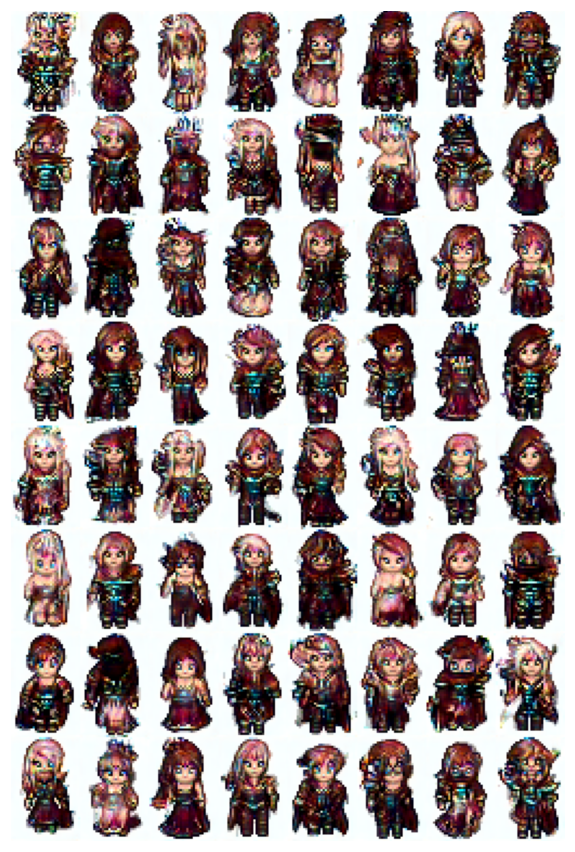

In [7]:
im = show(mean, 8)

In [ ]:
im.savefig('generated_0_epochs.png', dpi=110)

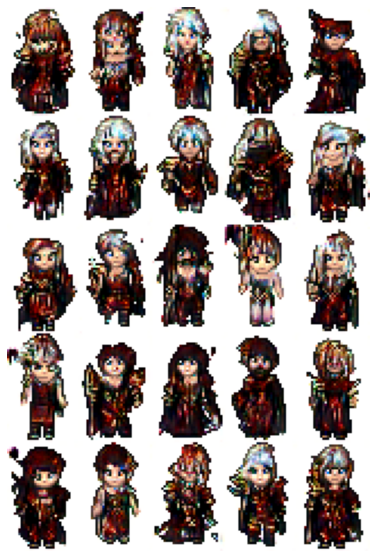

In [ ]:
show(generated_images[0], 5)